In [2]:
import os

import numpy as np
import numpy.ma as ma
import pandas as pd
import geopandas as gpd
import seaborn as sns

import rasterio
import rasterio.plot

import shapely
from shapely.geometry.point import Point
from shapely.geometry.polygon import Polygon

from matplotlib import pyplot as plt
from matplotlib.path import Path
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib import gridspec as gridspec
import matplotlib.patheffects as patheffects

import contextily as cx
from tqdm import tqdm

import IR_processing_utils

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 7

In [5]:
# path2IR_rasters = [r"M:\202507 Ingilor\Mavic3_IR\geotiffs\20250717_no1_Vol2_morning_t51.tif", 
#                    r"M:\202507 Ingilor\Mavic3_IR\geotiffs\20250717_no1_Vol2_morning_t541.tif",
#                    r"M:\202507 Ingilor\Mavic3_IR\geotiffs\20250717_no3_Vol2_evening_t541.tif"]

path2IR_rasters = [r"M:\202507 Ingilor\Mavic3_IR\geotiffs\20250718_no2_Vol1andCTRL_noshield_t51.tif",
                   r"M:\202507 Ingilor\Mavic3_IR\geotiffs\20250718_no2_Vol1andCTRL_noshield_t541.tif"]

In [6]:


rasters = []

for i, path in enumerate(path2IR_rasters):

    raster = {}

    display(path)

    src = rasterio.open(path)
    
    data = src.read() 
    values = data [0,:,:]
    mask = data [1,:,:]

    n = np.sum (mask > 0)
    #display(n)
    

    raster['fname'] = os.path.basename(path)
    raster['name'] = raster['fname']
    raster['values'] = ma.masked_array(values, ~mask.astype(bool))
    raster['extent'] = (src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top)
    raster['lons'], raster['lats'] =  IR_processing_utils.get_subarray_coords_rio (values.shape, src.crs, src.transform)
    raster['vmin2draw'] = np.nanpercentile(raster['values'].copy().filled(np.nan).flatten(), 1)
    raster['vmax2draw'] = np.nanpercentile(raster['values'].copy().filled(np.nan).flatten(), 99) #np.percentile(np.copy(raster['values'].flatten()), 99)
    rasters.append(raster)
    #break

'M:\\202507 Ingilor\\Mavic3_IR\\geotiffs\\20250718_no2_Vol1andCTRL_noshield_t51.tif'

'M:\\202507 Ingilor\\Mavic3_IR\\geotiffs\\20250718_no2_Vol1andCTRL_noshield_t541.tif'

In [7]:
min_lon = np.min([r['extent'][0] for r in rasters])
max_lon = np.max([r['extent'][1] for r in rasters])
min_lat = np.min([r['extent'][2] for r in rasters])
max_lat = np.max([r['extent'][3] for r in rasters])

ir_lon_lim = np.array([min_lon - 0.005 * (max_lon - min_lon), max_lon + 0.005 * (max_lon - min_lon)])
ir_lat_lim = np.array([min_lat - 0.005 * (max_lat - min_lat), max_lat + 0.005 * (max_lat - min_lat)])



In [27]:
cropping_polygon = Polygon([(ir_lon_lim[0], ir_lat_lim[0]), (ir_lon_lim[1], ir_lat_lim[0]),
                            (ir_lon_lim[1], ir_lat_lim[1]), (ir_lon_lim[0], ir_lat_lim[1])]).buffer(0)

In [30]:
path2polygons= r"D:\!Work\!projects\2025 Овцебыки\Ingilor_polygons.shp"
polygons = gpd.read_file (path2polygons)



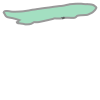

In [37]:
shapely.make_valid(polygons['geometry'][1]) #.is_valid 

In [ ]:
polygons_cr = polygons.copy()
for i in range (polygons_cr.shape[0]):
    
        

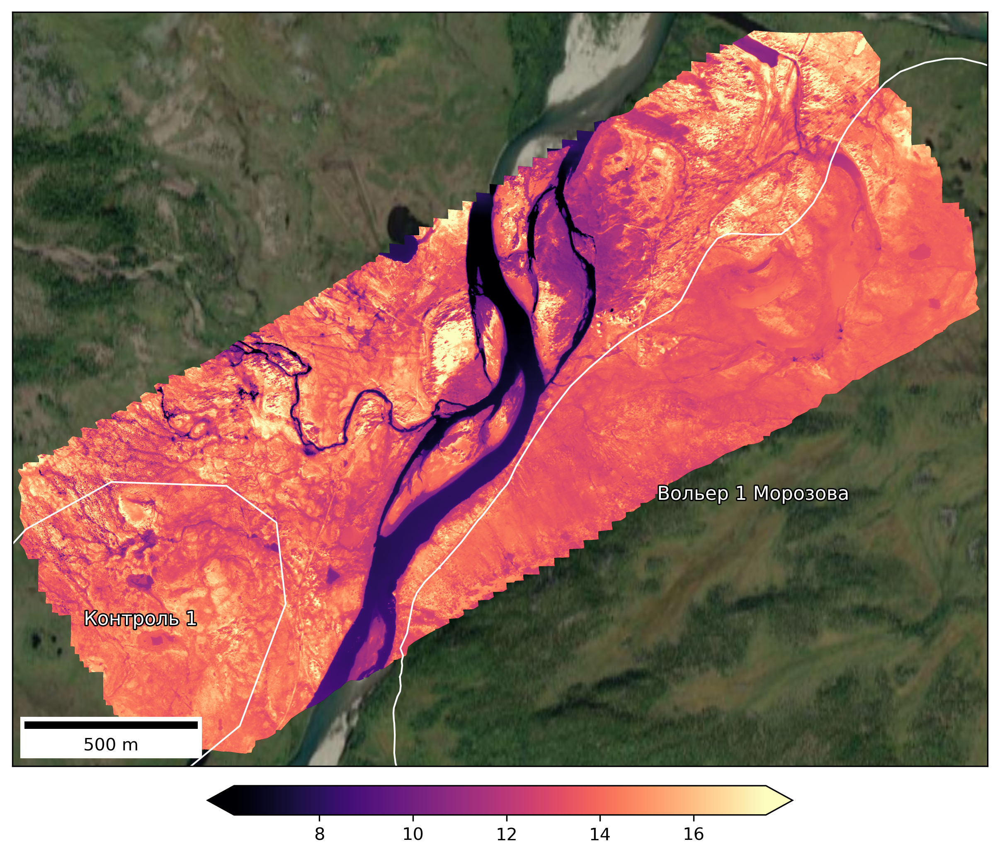

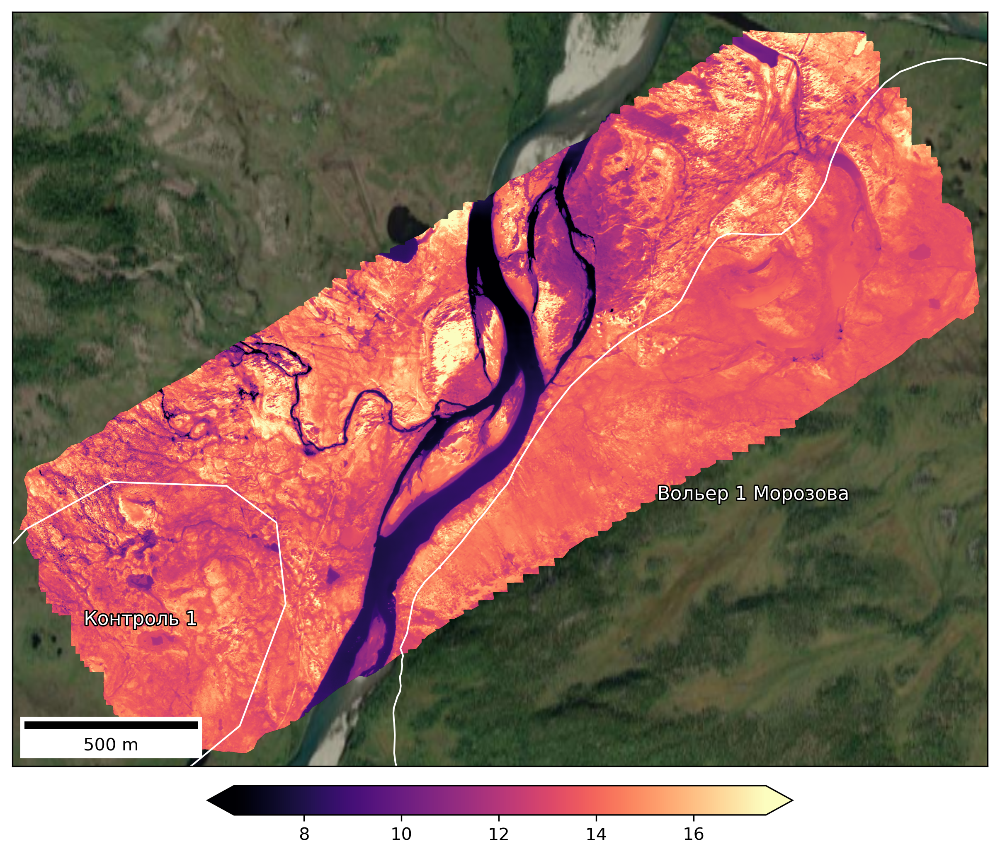

In [43]:
plt.rcParams['font.size'] = 10
pics_dir = 'pics_IR_Ingilor'
if not os.path.isdir (pics_dir):
    os.mkdir(pics_dir)

colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
colors[0], colors[1] = colors[1], colors[0]
colors[1], colors[2] = colors[2], colors[1]


#colors = ['red', 'green', 'orange', 'green']

for i, raster in enumerate (rasters):

    fig = plt.figure(figsize = (8, 8))
    
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])

    plt.subplots_adjust(left=0.01, right=0.99, bottom=0, top=0.99)

    plt.xlim(ir_lon_lim)
    plt.ylim(ir_lat_lim)
    try:
        cx.add_basemap(plt.gca(), source = cx.providers.Esri.WorldImagery, crs = 4326, attribution_size = 2, attribution = '')              
    except Exception as err:
        print ('basemap is not availible')

    im = plt.imshow (raster['values'], extent= raster['extent'], cmap = 'magma', 
                     vmin=raster['vmin2draw'], vmax=raster['vmax2draw'])
    
    polygons.plot(ax = plt.gca(), facecolor='None', edgecolor='white')



    for idx, row in polygons.iterrows():
        geometry_cropped = cropping_polygon.intersection(shapely.make_valid(row.geometry))
        if geometry_cropped:
            plt.annotate(text=row['name'], xy = (shapely.centroid (geometry_cropped).x, shapely.centroid (geometry_cropped).y), #xy=row['coords'],
                        horizontalalignment='center', fontsize = 11, color = 'white', 
                        path_effects=[patheffects.withStroke(linewidth=1.5, foreground='black', capstyle="round")]) 

    points = gpd.GeoSeries([Point(161, ir_lat_lim.mean()), Point(162, ir_lat_lim.mean())], crs=4326)  # Geographic WGS 84 - degrees
    points = points.to_crs(32619)
    distance_meters = points[0].distance(points[1])

    scalebar = ScaleBar(distance_meters, length_fraction=0.2, location = 'lower left', pad = 0.2, border_pad = 0.5, rotation='horizontal-only') #, units = "km", )
    
    plt.gca().add_artist(scalebar)                     

    pos = plt.gca().get_position().bounds
    plt.gca().set_aspect(1/np.cos(np.radians(ir_lat_lim.mean())))

    plt.colorbar(im, location = 'bottom', orientation='horizontal', shrink = 0.6, pad=0.02, extend='both')
    
    plt.savefig ((pics_dir + '/' + raster['name'] + '_new.png').replace(':', ''))
    
